# การวิเคราะห์ความนิยมของสมาร์ทโฟนในปัจจุบัน 

# ขั้นตอนที่ 1: Access Twitter API keys

* สร้างบัญชี Twitter เพื่อใช้ในการ
* Login เข้าสู่เว็บไซต์ https://apps.twitter.com/
* เลือก "Create New App"
* กรอกข้อมูลในแบบฟอร์ม และยอมรับข้อตกลงการใช้งาน จากนั้นเลือก "Create your Twitter application"
* ในหน้าถัดไป เลือกแถบ "API keys" จากนั้นคัดลอก "API key" และ "API secret"
* เลือก "Create my access token" จากนั้นทำการคัดลอก "Access token" และ "Access token secret"

In [1]:
# Variables that contains the user credentials to access Twitter API
access_token = "370176271-UDHMCcE25NrsDiET46WWr9XtaNGNEwVRb1127AtG"
access_token_secret = "olT1krXMttfo6LwT0vYaFj9hXTa8ZCaLz5kJmLpk18DKw"
consumer_key = "2kn42UEsLSsmuIy14ZkNyPt7C"
consumer_secret = "Q1ysT9ORhEj9X72tF8fwUVQRCquNX5TnQfmou9Ga4XWcx6yN6C"

# ขั้นตอนที่ 2 : เชื่อมต่อกับ Twitter Streaming API และดาวน์โหลดข้อมูล
เราจะใช้ Tweepy ซึ่งเป็น Library ของ Python ในการเชื่อมต่อกับ Twitter Streaming API และทำการดาวน์โหลดข้อมูลเพื่อเขียนลงในไฟล์ "tweets.json"

หากคุณไม่มี Tweepy สามารถดาวน์โหลดได้จาก https://github.com/tweepy/tweepy และทำการ Install ด้วยคำสั่ง [ python setup.py install ]

In [2]:
#Import the necessary methods from tweepy library
from tweepy.streaming import StreamListener
from tweepy import OAuthHandler
from tweepy import Stream
import json

#This is a basic listener that just prints received tweets to stdout.
class MyListener(StreamListener):

    def on_data(self, data):
        try:
            with open('tweets.json', 'a') as f:
                f.write(data)
                dat = json.loads(data)
                print "%s %s" % (dat['created_at'], dat['text'])
                return True
        except BaseException as e:
            print("--> Error on_data: %s" % str(e))
            pass
        return True

    def on_error(self, status):
        print status

if __name__ == '__main__':

    #This handles Twitter authetification and the connection to Twitter Streaming API
    auth = OAuthHandler(consumer_key, consumer_secret)
    auth.set_access_token(access_token, access_token_secret)
    twitter_stream = Stream(auth, MyListener())

    #This line filter Twitter Streams to capture data by the keywords(Brands of smartphone) 
    twitter_stream.filter(track=['iPhone', 'Samsung Galaxy', 'Google Pixel', 'OnePlus', 'Google Nexus', 'LG G5', 'HTC', 'Huawei', 'Motorola Moto Play'])

    

Wed Dec 14 07:35:55 +0000 2016 RT @techbeardblog: How to Fake iPhone 7 Plus Like Bokeh Effects on Any iPhone https://t.co/LKcwoRKEPv #iPhone #Apple #iOS #HowTo #TechTips…
Wed Dec 14 07:35:55 +0000 2016 RT @LitsaDremousis: Democratic House Candidates Were Also Targets of Russian Hacking, via @nytimes // ESSENTIAL &amp; getting overlooked. https…
Wed Dec 14 07:35:55 +0000 2016 I owe my life to Sprint, I made so much money off my iPhone ...
Wed Dec 14 07:35:55 +0000 2016 RT @ShiverMiTxmbers: I'm now an A-List celebrity in Kim Kardashian: Hollywood. You can be famous too by playing on iPhone!  https://t.co/s6…
Wed Dec 14 07:35:55 +0000 2016 モイ！iPhoneからキャス配信中 -ちとだけ😉 https://t.co/ZeMPdNOXq3
Wed Dec 14 07:35:56 +0000 2016 RT @FaZeCez: iPhone 7 GIVEAWAY

4 WINNER(S)

TO ENTER:
RETWEET
TURN MY POST NOTIFICATIONS ON
FOLLOW ME
Ends AT 800 RTS https://t.co/2N8xERp…
Wed Dec 14 07:35:56 +0000 2016 RT @theasyrafzabani: Dah nak 2017, masih duk percaya preorder iPhone dan segala bagai barang. Dah takda

KeyboardInterrupt: 

ทำการอ่านข้อมูลและเก็บใส่ในตัวแปรชนิดอาเรย์ที่ชื่อ tweets_data

In [1]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import sys
tweets_data_path = 'C:\\BigData\\tweets(multilang).json'

tweets_data = []
tweets_file = open(tweets_data_path, "r")
count = 0
for line in tweets_file:
    try:
        count = count + 1
        tweet = json.loads(line)
        tweets_data.append(tweet)
        if count%100 == 0:
            sys.stdout.write('.')
        if count%7000 == 0:
            sys.stdout.write('\n')
    except Exception as e:
        print e
        continue
print "\n%s tweets read." % (count)

......................................................................
......................................................................
......................................................................
......................................................................
......................................................................
......................................................................
......................................................................
......................................................................
......................................................................
......................................................................
......................................................................
......................................................................
......................................................................
......................................................................
......

# ขั้นตอนที่ 3 : จัดการโครงสร้างของข้อมูล
ทำการติด label ให้แต่ละทวีตเพื่อง่ายต่อการนำไปใช้งาน

สร้างตัวแปร **tweets** โดยมีโครงสร้างเป็น Dataframe เพื่อลดความซับซ้อนในการจัดการข้อมูล โดยใช้คำสั่งต่อไปนี้

ขั้นตอนถัดไป ทำการเพิ่มคอลัมน์ *text* เพื่อใส่เนื้อหาในแต่ละทวีต, *lang* เพื่อใส่ภาษาที่ใช้ในการเขียนทวีตนั้นๆ และ *country* เพื่อใส่ข้อมูลว่าทวีตนั้นๆมาจากประเทศอะไร

In [2]:
tweets = pd.DataFrame()
tweets['text'] = map(lambda tweet: tweet.get('text', None), tweets_data)
tweets['lang'] = map(lambda tweet: tweet.get('lang', None), tweets_data)
tweets['city'] = map(lambda tweet: tweet['user']['location'] if tweet.get('user') != None else None, tweets_data)
tweets.head(100)

,text,lang,city
0,RT @nutnicha_hippie: Huawei สร้างแบรนด์เก่งมาก...,th,Nakhonratchasima
1,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,Triangle
2,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,None
3,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,"Bangkok, Thailand"
4,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,ประเทศไทย
5,RT @tatartnr: ตะกี๊ dtac โทรมาถามว่าจะย้ายออกท...,th,None
6,RT @tatartnr: ตะกี๊ dtac โทรมาถามว่าจะย้ายออกท...,th,None
7,RT @mayflashfly: iPhone รุ่นแรก ยังไม่ได้แกะกล...,th,None
8,RT @tatartnr: ตะกี๊ dtac โทรมาถามว่าจะย้ายออกท...,th,"Bangkok, Thailand"
9,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,สีโทนเย็น


ขั้นตอนถัดมา ทำการสร้างกราฟที่แสดงผล 20 ประเทศที่ทำการทวีตมากที่สุดจากข้อมูลที่เก็บ

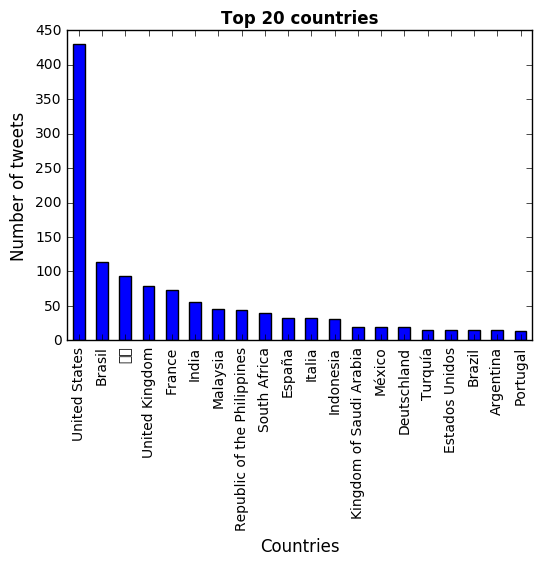

In [3]:
%matplotlib inline
tweets['country'] = map(lambda tweet: tweet['place']['country'] if tweet.get('place') != None else None, tweets_data)
tweets_by_country = tweets['country'].value_counts()

fig, ax = plt.subplots()
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)
ax.set_xlabel('Countries', fontsize=12)
ax.set_ylabel('Number of tweets' , fontsize=12)
ax.set_title('Top 20 countries', fontsize=12, fontweight='bold')
tweets_by_country[:20].plot(ax=ax, kind='bar', color='blue')

# ขั้นตอนที่ 4 : สกัดข้อมูลที่ต้องการศึกษา

สร้างฟังก์ชัน **word_in_text** ที่ใช้ในการทำ String Matching โดยฟังก์ชันนี้จะ return True เมื่อพบ word ใน text, กรณีอื่นๆทำการ return False

In [4]:
import re
def word_in_text(word, text):
    try:
        word = word.lower()
        text = text.lower()
        match = re.search(word, text)
        if match:
            return 1
        return 0
    except:
        return 0


ใช้ฟังก์ชัน **word_in_text** ในการค้นหาแต่ละทวีตว่ามี keywords ที่ต้องการอยู่หรือไม่ 

In [5]:
tweets['iPhone'] = tweets['text'].apply(lambda tweet: word_in_text('iPhone 7', tweet))
tweets['Samsung'] = tweets['text'].apply(lambda tweet: word_in_text('Samsung Galaxy',tweet))
tweets['Google Pixel'] = tweets['text'].apply(lambda tweet: word_in_text('Google Pixel', tweet))
tweets['OnePlus'] = tweets['text'].apply(lambda tweet: word_in_text('OnePlus', tweet))
tweets['Google Nexus'] = tweets['text'].apply(lambda tweet: word_in_text('Google Nexus',tweet))
tweets['LG'] = tweets['text'].apply(lambda tweet: word_in_text('LG', tweet))
tweets['HTC'] = tweets['text'].apply(lambda tweet: word_in_text('HTC',tweet))
tweets['Huawei'] = tweets['text'].apply(lambda tweet: word_in_text('Huawei', tweet))
tweets.head(100)

,text,lang,city,country,iPhone,Samsung,Google Pixel,OnePlus,Google Nexus,LG,HTC,Huawei
0,RT @nutnicha_hippie: Huawei สร้างแบรนด์เก่งมาก...,th,Nakhonratchasima,None,0,0,0,0,0,0,0,1
1,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,Triangle,None,0,0,0,0,0,0,0,1
2,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,None,None,0,0,0,0,0,0,0,1
3,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,"Bangkok, Thailand",None,0,0,0,0,0,0,0,1
4,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,ประเทศไทย,None,0,0,0,0,0,0,0,1
5,RT @tatartnr: ตะกี๊ dtac โทรมาถามว่าจะย้ายออกท...,th,None,None,0,0,0,0,0,0,0,0
6,RT @tatartnr: ตะกี๊ dtac โทรมาถามว่าจะย้ายออกท...,th,None,None,0,0,0,0,0,0,0,0
7,RT @mayflashfly: iPhone รุ่นแรก ยังไม่ได้แกะกล...,th,None,None,0,0,0,0,0,0,0,0
8,RT @tatartnr: ตะกี๊ dtac โทรมาถามว่าจะย้ายออกท...,th,"Bangkok, Thailand",None,0,0,0,0,0,0,0,0
9,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,สีโทนเย็น,None,0,0,0,0,0,0,0,1


แสดงความถี่ของแต่ละ keywords ที่พบจากข้อมูลทั้งหมดที่เก็บมา

In [6]:
print "iPhone: " + str(tweets['iPhone'].value_counts()[1])
print "Samsung: " +  str(tweets['Samsung'].value_counts()[1])
print "Google Pixel: " + str(tweets['Google Pixel'].value_counts()[1])
print "OnePlus: " + str(tweets['OnePlus'].value_counts()[1])
print "Google Nexus: " + str(tweets['Google Nexus'].value_counts()[1])
print "LG: " + str(tweets['LG'].value_counts()[1])
print "HTC: " + str(tweets['HTC'].value_counts()[1])
print "Huawei: " + str(tweets['Huawei'].value_counts()[1])

iPhone: 19221
Samsung: 7465
Google Pixel: 4508
OnePlus: 3686
Google Nexus: 256
LG: 3139
HTC: 3973
Huawei: 4440


นำความถี่ที่ได้มาแสดงผลในรูปแบบ Pie Chart

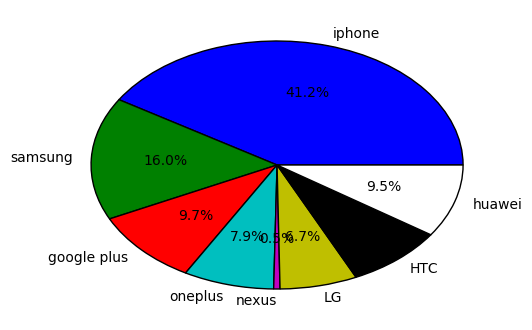

In [7]:
iphone = tweets['iPhone'].value_counts()[1]
samsung = tweets['Samsung'].value_counts()[1]
google =  tweets['Google Pixel'].value_counts()[1]
oneplus =  tweets['OnePlus'].value_counts()[1]
nexus =  tweets['Google Nexus'].value_counts()[1]
lg = tweets['LG'].value_counts()[1]
htc = tweets['HTC'].value_counts()[1]
huawei = tweets['Huawei'].value_counts()[1] 
lbls = ['iphone', 'samsung', 'google plus', 'oneplus', 'nexus', 'LG', 'HTC', 'huawei']
sizes = [iphone,samsung,google,oneplus,nexus,lg,htc,huawei]
plt.pie(sizes, labels=lbls, autopct='%1.1f%%')
plt.show()

สร้างฟังก์ชัน **extract_link** ที่ใช้ในการตัดลิงค์ออกจากข้อความ โดยฟังก์ชันนี้จะ return ลิงค์ เมื่อสามารถตัดได้และเป็น unicode, กรณีตัดไม่ได้จะ return "not match, ส่วนกรณีไม่ใช่ unicode จะ return "wrong type"

In [8]:
def extract_link(text):
    regex = r'https?://[^\s<>"]+|www\.[^\s<>"]+'
    if type(text) == unicode:
        match = re.search(regex, text)
        if match:
            return match.group()
        else:
            return "not match"
    else:
        return "wrong type"

In [12]:
print set(tweets['text'])

set([u"Je m'\xe9clate avec #ClumsyNinja sur iPhone\xa0! Rejoins-moi GRATUITEMENT\xa0! https://t.co/G8106ZSUYp", u'MINT! Apple iPhone 4s - 16GB - Black (Verizon) - UNLOCKED, in original box! https://t.co/5lNzSus0Me https://t.co/Eu0FBOvhZC', u'\xa1He cosechado 1,050 de comida! \xa1Mira tus huertos tambi\xe9n!   https://t.co/VH1x4iNOhW #iphone, #iphonegames, #gameinsight', u'Best iPhone App to Try: ISS Finder https://t.co/nv2dyc1cNe &lt;&lt; Download Here https://t.co/kSsElFHXri', u'Good gadget! https://t.co/reH3Ugcgwz', u'@meromero1224 \n\n\u3080\u30fc\u3055\u3041\uff5e\u3093\u30fd(*\xb4\u2200\uff40)\u30ce\niPhone\u304c\u2026\niPhone\u304c\u2026\n\u304a\u305d\u30ea\u30d7\u3054\u3081\u3093\u3088\u3049\uff5e\U0001f4a7\n\n\u3046\u3061\u306e\u5a18\u306f\u304b\u306a\u308a\u306e\u304a\u5e74\u9803\u3049\uff5e\n\u7d50\u5a5a\u3059\u308b\u6c17\u3042\u308b\u3093\u304b\u306a\u3044\u3093\u304b\u2026\n\u8caf\u3081\u3066\u3093\u306e\u304b\u3044\uff01\u3063\u3066\u306a^^;\n\u304a\u571f\u7523\u306f\u3046

ใช้ฟังก์ชัน **extract_link** ในการตัดลิงค์ออกมาจากแต่ละทวีต

In [13]:
tweets['link'] = (tweets['text']).apply(lambda tweet: extract_link(tweet))
tweets['link']

0                       not match
1                       not match
2                       not match
3                       not match
4                       not match
5                       not match
6                       not match
7         https://t.co/hs0ezdMmdt
8                       not match
9                       not match
10                      not match
11                      not match
12                      not match
13                      not match
14                      not match
15                      not match
16                      not match
17        https://t.co/5LSsebUKwa
18                      not match
19                      not match
20                      not match
21                      not match
22                      not match
23                      not match
24                      not match
25        https://t.co/8TKeJP94h0
26                      not match
27                      not match
28        https://t.co/cJ9pKI7K1B
29            

In [11]:
tweets

,text,lang,city,country,iPhone,Samsung,Google Pixel,OnePlus,Google Nexus,LG,HTC,Huawei,link
0,RT @nutnicha_hippie: Huawei สร้างแบรนด์เก่งมาก...,th,Nakhonratchasima,None,0,0,0,0,0,0,0,1,not match
1,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,Triangle,None,0,0,0,0,0,0,0,1,not match
2,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,None,None,0,0,0,0,0,0,0,1,not match
3,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,"Bangkok, Thailand",None,0,0,0,0,0,0,0,1,not match
4,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,ประเทศไทย,None,0,0,0,0,0,0,0,1,not match
5,RT @tatartnr: ตะกี๊ dtac โทรมาถามว่าจะย้ายออกท...,th,None,None,0,0,0,0,0,0,0,0,not match
6,RT @tatartnr: ตะกี๊ dtac โทรมาถามว่าจะย้ายออกท...,th,None,None,0,0,0,0,0,0,0,0,not match
7,RT @mayflashfly: iPhone รุ่นแรก ยังไม่ได้แกะกล...,th,None,None,0,0,0,0,0,0,0,0,https://t.co/hs0ezdMmdt
8,RT @tatartnr: ตะกี๊ dtac โทรมาถามว่าจะย้ายออกท...,th,"Bangkok, Thailand",None,0,0,0,0,0,0,0,0,not match
9,RT @ShunJou: Huawei สร้างแบรนด์เก่งมาก ตอนนี้ใ...,th,สีโทนเย็น,None,0,0,0,0,0,0,0,1,not match


# ขั้นตอนที่ 5 : แสดงผลข้อมูลในรูปแบบแผนที่ด้วย GeoJSON

โค้ดในส่วนนี้จะอ่านข้อมูล และหาตำแหน่งที่มาของแต่ละทวีต และสร้างออกมาเป็นโครงสร้างข้อมูลแบบ GeoJSON ที่เก็บอยู่ในไฟล์ชื่อ **geo_data.json**

In [14]:
import json
import sys

#fname = "tweets.json"
f = open(fname, 'r')
# f is the file pointer to the JSON data set
count = 1

# Tweets are stored in "fname"
with open(fname, 'r') as f:
    geo_data = {
        "type": "FeatureCollection",
        "features": []
    }
    tweets = []
    geo2 = []
    for line in f:
        count = count + 1
        if count%500 == 0:
            sys.stdout.write('.')
        if count%35000 == 0:
            sys.stdout.write('\n')
        tweet = json.loads(line)
        tweets.append(tweet)
        if tweet['coordinates']:
            geo_json_feature = {
                "type": "Feature",
                "geometry": tweet['coordinates'],
                "properties": {
                    "text": tweet['text'],
                    "created_at": tweet['created_at']
                }
            }
            geo_data['features'].append(geo_json_feature)
            geo2.append(tweet['coordinates'])
print '\nWait..'
# Save geo data
with open('geo_data.json', 'w') as fout:
    fout.write(json.dumps(geo_data, indent=4))
    
print 'Done..'

NameError: name 'fname' is not defined

สร้างไฟล์ html ที่ใช้ในการอ่านและแสดงผลข้อมูลจากไฟล์ **geo_data.json**

In [ ]:
<html>
  <head>
    <title>Vega Scaffold</title>
    <link rel="stylesheet" href="http://cdnjs.cloudflare.com/ajax/libs/leaflet/0.7.3/leaflet.css" />
    <script src="http://cdnjs.cloudflare.com/ajax/libs/leaflet/0.7.3/leaflet.js"></script>
    <script src="http://code.jquery.com/jquery-2.1.0.min.js"></script>	
    <style>
    #map {
        height: 700px;
    }
    </style>
  </head>
  <body>
    <div id="map"></div>
  </body>
<script type="text/javascript">
// Load the tile images from OpenStreetMap
function onEachFeature(feature, layer){
    if(feature.properties && feature.properties.text){
        layer.bindPopup(feature.properties.text);
    }
}

var mytiles = L.tileLayer('http://{s}.tile.osm.org/{z}/{x}/{y}.png', {
    attribution: '&copy; <a href="http://osm.org/copyright">OpenStreetMap</a> contributors'
});
// Initialise an empty map
var map = L.map('map');
// Read the GeoJSON data with jQuery, and create a circleMarker element for each tweet
// Each tweet will be represented by a nice red dot
$.getJSON("./geo_data2.json", function(data) {
    var myStyle = {
        radius: 2,
        fillColor: "red",
        color: "red",
        weight: 1,
        opacity: 1,
        fillOpacity: 1
    };
    console.log(data) 
    var geojson = L.geoJson(data, {
        onEachFeature: onEachFeature
    }).addTo(map)
});
// Add the tiles to the map, and initialise the view in the middle of Europe
map.addLayer(mytiles).setView([50.5, 5.0], 5);
</script>
</html>

เปิดใช้งาน built-in web server in Python โดยใช้คำสั่ง

เข้า server ด้วย url: http://localhost:8000/ จากนั้นเข้า Directory ที่ทำการเก็บไฟล์ **geo_data.json** เพื่อทำการแสดงผลข้อมูลในรูปแบบแผนที่